##### import libraries

In [1]:
import json 
import cv2
from matplotlib import pyplot as plt
import numpy, numpy as np
# from preprocess import *
import SimpleITK as sitk
from collections import OrderedDict
import os
from os.path import exists, join
# from register_images import *
import torch, torch.nn as nn
from torch.autograd import Variable
import sys
sys.path.insert(0, '../')
import time
import pydicom
from pathlib import Path

from register_images import runCnn
from model.ProsRegNet_model import ProsRegNet

from miit.spatial_data.base_types import Image as MImage
from miit.spatial_data.base_types import Annotation as MAnnotation
from miit.utils.distance_unit import DUnit

In [42]:
def load_mri(directory):
    file_id_list = []
    for file_ in os.listdir(directory):
        path = join(directory, file_)
        dc = pydicom.dcmread(path)
        instance_number = int(dc[0x0020, 0x0013].value)
        file_id_list.append((instance_number, file_))
    file_id_list_sorted = sorted(file_id_list, key=lambda x: x[0])
    img_series_reader = sitk.ImageSeriesReader()
    img_series_reader.SetFileNames([join(directory, x[1]) for x in file_id_list_sorted])
    # img_series_reader.
    t2w_img_sitk = img_series_reader.Execute()
    return t2w_img_sitk      


def get_padding_params(img: numpy.array, shape: int) -> tuple[int, int, int, int]:
    pad_x = shape - img.shape[0]
    pad_x_l = pad_x // 2
    pad_x_u = pad_x // 2
    if pad_x % 2 != 0:
        pad_x_u += 1
    pad_y = shape - img.shape[1]
    pad_y_l = pad_y // 2
    pad_y_u = pad_y // 2
    if pad_y % 2 != 0:
        pad_y_u += 1
    return pad_y_l, pad_y_u, pad_x_l, pad_x_u


def scale_image(img, factors: tuple[float, float], interpolation: int = 1):
    w, h = img.shape[:2]
    nw = int(w * factors[0])
    nh = int(h * factors[1])
    return cv2.resize(img, (nh, nw), interpolation=interpolation)
    
        

def preprocess_hist(img: numpy.ndarray, 
                         mask: numpy.ndarray,
                         padding: int = 30) -> tuple[numpy.ndarray, numpy.ndarray, dict]:
    """Does the following preprocessing steps:
        1. Applies mask.
        2. Crops around the masked area.
        3. Adds padding.
    """

    # Downsize by 4. Or resize to 500px
    if len(mask.shape) == 2:
        mask_ = np.expand_dims(mask, -1)
    else:
        mask_ = mask
    img = img * mask_
    # This doesnt make sense, since the cropping happens immediately afterwards.
    # Maybe a refactoring mistake?

    # create a bounding box around slice
    preprocessing_steps = {}
    points = np.argwhere(mask != 0)
    points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
    y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
    img = img[x:x+w, y:y+h]
    mask = mask[x:x+w, y:y+h]
    preprocessing_steps['crop'] = {}
    preprocessing_steps['crop']['y'] = y
    preprocessing_steps['crop']['x'] = x
    preprocessing_steps['crop']['h'] = h
    preprocessing_steps['crop']['w'] = w
    # Pad to a square shape now.
    max_size = max(img.shape[0], img.shape[1])
    ylo, yhi, xlo, xhi = get_padding_params(img, max_size)
    ylo += padding
    yhi += padding
    xlo += padding
    xhi += padding
    preprocessing_steps['sym_pad'] = {}
    preprocessing_steps['sym_pad']['ylo'] = ylo
    preprocessing_steps['sym_pad']['yhi'] = yhi
    preprocessing_steps['sym_pad']['xlo'] = xlo
    preprocessing_steps['sym_pad']['xhi'] = xhi
    img = np.pad(img,((xlo, xhi),(ylo, yhi),(0,0)),'constant', constant_values=0)
    mask = np.pad(mask,((xlo, xhi), (ylo, yhi)),'constant', constant_values=0)
    return img, mask, preprocessing_steps


def preprocess_mri(mri: numpy.ndarray,
                    mri_masks: numpy.ndarray,
                    padding: int = 30):
    if len(mri.shape) == 0:
        mri = np.expand_dims(mri, 0)
    prepr_mri = []

    # Make a first pass to get the maximum size
    max_size = 0
    for i in range(mri_masks.shape[0]):
        mask = mri_masks[i]
        points = np.argwhere(mask != 0)
        points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
        y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
        max_size_ = max(w, h)
        if max_size_ > max_size:
            max_size = max_size_

    max_size = max_size + 2 * padding
    for i in range(mri.shape[0]):
        prepr_steps = {}
        mri_slice = mri[i]
        mri_mask = mri_masks[i]

        if np.sum(mri_mask) == 0:
            continue

        mri_slice = mri_slice * mri_mask
        mri_mask = mri_mask * 255
        points = np.argwhere(mri_mask != 0)
        points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
        y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
        prepr_steps['crop'] = {}
        prepr_steps['crop']['y'] = y
        prepr_steps['crop']['x'] = x
        prepr_steps['crop']['h'] = h
        prepr_steps['crop']['w'] = w
        prepr_steps['crop']['size_before_crop'] = mri_slice.shape
        prepr_steps['slice'] = i

        mri_slice = mri_slice[x:x+w, y:y+h]
        mri_slice = mri_slice / max(int(np.max(mri_slice) / 255), 1)
        mri_slice = mri_slice * 25.5/(np.max(mri_slice)/10)

        print('mri_slice after cropping', mri_slice.shape)

        ylo, yhi, xlo, xhi = get_padding_params(mri_slice, max_size)
        prepr_steps['sym_pad'] = {}
        prepr_steps['sym_pad']['ylo'] = ylo
        prepr_steps['sym_pad']['yhi'] = yhi
        prepr_steps['sym_pad']['xlo'] = xlo
        prepr_steps['sym_pad']['xhi'] = xhi

        mri_slice = np.pad(mri_slice,((xlo, xhi),(ylo, yhi)),'constant', constant_values=0)
        mri_mask = np.pad(mri_mask,((xlo, xhi), (ylo, yhi)),'constant', constant_values=0)

        print('mri_slice after padding')
        print(mri_slice.shape)
             
        prepr_mri.append((i, mri_slice, mri_mask, prepr_steps))
    return prepr_mri


def preprocess_image_high_res(image, half_out_size=500):
    resizeCNN = GeometricTnf(out_h=half_out_size*2, out_w=half_out_size*2, use_cuda = False) 

    # convert to torch Variable
    image = np.expand_dims(image.transpose((2,0,1)),0)
    image = torch.Tensor(image.astype(np.float32)/255.0)
    image_var = Variable(image,requires_grad=False)

    # Resize image using bilinear sampling with identity affine tnf
    image_var = resizeCNN(image_var)

    # Normalize image
    image_var = normalize_image(image_var)

    return image_var



from dataclasses import dataclass, field

from miit.registerers.base_registerer import Registerer, RegistrationResult
from numpy import ndarray

from geotnf.transformation_high_res import GeometricTnf_high_res
from geotnf.transformation import GeometricTnf
from image.normalization import normalize_image


@dataclass(kw_only=True)
class ProsRegNetExt:

    use_cuda: bool
    affine_model: nn.Module | None = None
    tps_model: nn.Module | None = None
    

    @classmethod
    def init_registerer(cls, 
                        path_to_affine_model: str | None = None,
                        path_to_tps_model: str | None = None,
                        use_cuda: bool | None = None,
                        feature_extraction_cnn: str = 'resnet101'):
        if use_cuda is None:
            use_cuda = torch.cuda.is_available()
        if path_to_affine_model:
            affine_model = ProsRegNet(use_cuda=use_cuda, geometric_model='affine', feature_extraction_cnn=feature_extraction_cnn)
        if path_to_tps_model:
            tps_model = ProsRegNet(use_cuda=use_cuda, geometric_model='tps', feature_extraction_cnn=feature_extraction_cnn) 
        return cls(affine_model=affine_model,
                   tps_model=tps_model,
                   use_cuda=use_cuda)   
    
    def register(self, 
                 hist_img: numpy.ndarray, 
                 mri: numpy.ndarray,
                 hist_mask: numpy.ndarray | None = None,
                 mri_mask: numpy.ndarray | None = None,
                 hist_resolution: DUnit | tuple[DUnit, DUnit] | None = None,
                 mri_resolution: DUnit | tuple[DUnit, DUnit] | None = None,
                 reg_resolution: DUnit | tuple[DUnit, DUnit] | None = None,
                 do_affine: bool = True,
                 do_tps: bool = True,
                 use_masks_as_affine: bool = True,
                 use_cuda: bool | None = None,
                 **kwargs: dict) -> RegistrationResult:
        if hist_resolution is None:
            hist_resolution = DUnit.default_dunit()
        if isinstance(hist_resolution, DUnit):
            hist_resolution = (hist_resolution, hist_resolution)
        
        if mri_resolution is None:
            mri_resolution = DUnit.default_dunit()
        if isinstance(mri_resolution, DUnit):
            mri_resolution = (mri_resolution, mri_resolution)
        
        if reg_resolution is None:
            reg_resolution = DUnit('75', 'um')
        if isinstance(reg_resolution, DUnit):
            reg_resolution = (reg_resolution, reg_resolution)

        transform_steps = {
            'hist': {},
            'mri': {}
        }

        transform_steps['hist']['hist_input_size'] = hist_img.shape[:2]
        transform_steps['hist']['hist_resolution'] = hist_resolution
        transform_steps['mri']['mri_input_size'] = mri.shape[1:]
        transform_steps['mri']['mri_resolution'] = mri_resolution
        transform_steps['reg_resolution'] = reg_resolution
        print('transform steps')
        print(transform_steps)

        hist_conversion_factor_w = reg_resolution[0].get_conversion_factor(hist_resolution[0])     
        hist_conversion_factor_h = reg_resolution[1].get_conversion_factor(hist_resolution[1])     
        
        mri_conversion_factor_w = reg_resolution[0].get_conversion_factor(mri_resolution[0])
        mri_conversion_factor_h = reg_resolution[1].get_conversion_factor(mri_resolution[1])
        
        transform_steps['hist']['conversion_factors'] = (hist_conversion_factor_w, hist_conversion_factor_h)
        transform_steps['mri']['conversion_factors'] = (mri_conversion_factor_w, mri_conversion_factor_h)

        hist_img = scale_image(hist_img, (hist_conversion_factor_w, hist_conversion_factor_h), interpolation=cv2.INTER_CUBIC)
        hist_mask = scale_image(hist_mask, (hist_conversion_factor_w, hist_conversion_factor_h), interpolation=cv2.INTER_NEAREST)
        print('hist after scaling')
        print(hist_img.shape)
        mri_swapped = np.moveaxis(mri, 0, 2)
        mri_mask_swapped = np.moveaxis(mri_mask, 0, 2)
        
        mri_swapped = scale_image(mri_swapped, (mri_conversion_factor_w, mri_conversion_factor_h), interpolation=cv2.INTER_CUBIC)                
        mri_mask_swapped = scale_image(mri_mask_swapped, (mri_conversion_factor_w, mri_conversion_factor_h), interpolation=cv2.INTER_NEAREST)
        
        mri_swapped = np.moveaxis(mri_swapped, 2, 0)
        mri_mask_swapped = np.moveaxis(mri_mask_swapped, 2, 0)
        print('mri after scaling')
        print(mri_swapped.shape)

        hist_img, hist_mask, hist_prepr = preprocess_hist(hist_img, hist_mask)
        transform_steps['hist']['hist_prepr'] = hist_prepr
        print('hist after preprocess_hist')
        print(hist_img.shape)
        mri_prep = preprocess_mri(mri_swapped, mri_mask_swapped)

        print('mri after preprocess')
        print(len(mri_prep))
        mri_slices = {}
        mri_masks = {}
        mri_prep_steps = {}
        for (slice_idx, mri_slice, mri_mask, prep_step) in mri_prep:
            mri_slices[slice_idx] = mri_slice
            mri_masks[slice_idx] = mri_mask
            mri_prep_steps[slice_idx] = prep_step
        print(mri_slice.shape)

        transform_steps['mri']['mri_prepr'] = mri_prep_steps
        transform_steps['reg_opts'] = (do_affine, do_tps)

        reg_result = self.register_(
            mri_slices,
            hist_img,
            mri_masks,
            do_affine,
            do_tps,
            use_masks_as_affine,
            use_cuda 
        )
        transform_steps['mri']['reg_result'] = reg_result
        return transform_steps


        
    def register_(self, 
                  mri_slices: dict[int, numpy.ndarray], 
                  hist_image: numpy.ndarray,                   
                  mri_masks: dict[int, numpy.ndarray] | None = None,
                  hist_mask: numpy.ndarray | None = None,
                  do_affine: bool = True,
                  do_tps: bool = True,
                  use_masks_as_affine: bool = True,
                  use_cuda: bool | None = None): 
        ####### grab files that were preprocessed     
        if use_cuda is None:
            use_cuda = self.use_cuda

        reg_data = {}
        count = len(mri_slices)
        model_cache = (self.affine_model, self.tps_model, do_affine, do_tps, use_cuda)
        print(f'Maximum count: {count}')
        for idx, key in enumerate(mri_slices): 
            print(idx)
            mri_slice = mri_slices[key]
            mri_mask = None if mri_masks is None else mri_masks[key]
            w_new, h_new = mri_slice.shape[:2]
            affTps, thetas = runCnn(model_cache=model_cache, 
                                    source_image=hist_image, 
                                    target_image=mri_slice, 
                                    source_mask=hist_mask,
                                    target_mask=mri_mask,
                                    use_mask_for_affine=use_masks_as_affine)         
            affTps = cv2.resize(affTps*255, (int(h_new),  int(w_new)), interpolation=cv2.INTER_CUBIC)   
            
            reg_data[key] = (thetas, affTps, hist_image, mri_slice)
        
        return reg_data

    def transform_image(self, 
                        image: numpy.ndarray, 
                        transformation, 
                        interpolation_mode):
        """
        Preprocessing steps to apply:
            1. Apply conversion
            2. Apply hist preprocessing
            3. Transform image
            4. Reverse apply mri preprocessing
            5. Reverse apply mri conversion
        """
        use_cuda = transformation.get('use_cuda', torch.cuda.is_available())
        # Step 1.
        hist_w, hist_h = transformation['hist']['conversion_factors']
        if interpolation_mode == 'NN':
            cv_interpolation = cv2.INTER_NEAREST
        elif interpolation_mode == 'LINEAR':
            cv_interpolation = cv2.INTER_LINEAR
        else:
            cv_interpolation = cv2.INTER_CUBIC

        print('image at beginning')
        print(image.shape)
        image = scale_image(image, (hist_w, hist_h), interpolation=cv_interpolation)
        print('image after scaling')
        print(image.shape)
        # Step 2.
        print('step2')        
        transformation['hist']['hist_prepr']
        y = transformation['hist']['hist_prepr']['crop']['y']
        x = transformation['hist']['hist_prepr']['crop']['x']
        h = transformation['hist']['hist_prepr']['crop']['h']
        w = transformation['hist']['hist_prepr']['crop']['w']

        image = image[x:x+w, y:y+h]
        print('image after cropping')
        print(image.shape)

        ylo = transformation['hist']['hist_prepr']['sym_pad']['ylo']
        yhi = transformation['hist']['hist_prepr']['sym_pad']['yhi']
        xlo = transformation['hist']['hist_prepr']['sym_pad']['xlo']
        xhi = transformation['hist']['hist_prepr']['sym_pad']['xhi']
        if len(image.shape) == 2:
            image = np.pad(image,((xlo, xhi),(ylo, yhi)),'constant', constant_values=0)
        else:
            image = np.pad(image,((xlo, xhi),(ylo, yhi),(0,0)),'constant', constant_values=0)

        print('image after padding')
        print(image.shape)
        # Step 3
        print('step3')        
        tpsTnf_high_res = GeometricTnf_high_res(geometric_model='tps', use_cuda=use_cuda)
        affTnf_high_res = GeometricTnf_high_res(geometric_model='affine', use_cuda=use_cuda)

        source_image_var_high_res = preprocess_image_high_res(image)
        if use_cuda:
            source_image_var_high_res = source_image_var_high_res.cuda()

        warped_images = {}
        for key in transformation['mri']['reg_result']:
            reg_result = transformation['mri']['reg_result'][key]
            (thetas, affTps, hist_image, mri_slice) = reg_result

            
            (do_affine, do_tps) = transformation['reg_opts']

            if do_affine:
                theta_aff1, theta_aff2 = thetas['affine']

            warped_image_aff_high_res = affTnf_high_res(source_image_var_high_res, theta_aff1.view(-1,2,3))
            warped_image_aff_high_res = affTnf_high_res(warped_image_aff_high_res, theta_aff2.view(-1,2,3))


            if do_affine and do_tps: 
                theta_aff_tps = thetas['tps'][0]
                warped_image_aff_tps_high_res = tpsTnf_high_res(warped_image_aff_high_res,theta_aff_tps)

            # Un-normalize images and convert to numpy
            if do_affine:
                warped_image_aff_np_high_res = normalize_image(warped_image_aff_high_res,forward=False).data.squeeze(0).transpose(0,1).transpose(1,2).cpu().numpy()

            if do_affine and do_tps:
                warped_image_aff_tps_np_high_res = normalize_image(warped_image_aff_tps_high_res,forward=False).data.squeeze(0).transpose(0,1).transpose(1,2).cpu().numpy()      
            
            # warped_image_aff_np_high_res[warped_image_aff_np_high_res < 0] = 0
            # warped_image_aff_tps_np_high_res[warped_image_aff_tps_np_high_res < 0] = 0    
            if do_affine and do_tps:
                warped_image= warped_image_aff_tps_np_high_res
            else:
                warped_image = warped_image_aff_np_high_res
            mri_target_size = transformation['mri']['reg_result'][key][3].shape
            mri_target_size = mri_target_size[::-1]
            warped_image = cv2.resize(warped_image*255, (mri_target_size), interpolation=cv2.INTER_CUBIC)   
            print('image after transform')
            print(warped_image.shape)

            # Step4

            print('step4')

            ylo = transformation['mri']['mri_prepr'][key]['sym_pad']['ylo']
            yhi = transformation['mri']['mri_prepr'][key]['sym_pad']['yhi']
            xlo = transformation['mri']['mri_prepr'][key]['sym_pad']['xlo']
            xhi = transformation['mri']['mri_prepr'][key]['sym_pad']['xhi']

            xhi = warped_image.shape[0] - xhi
            yhi = warped_image.shape[1] - yhi

            # Reverse of padding is just cropping.
            warped_image = warped_image[xlo:xhi, ylo:yhi]
            print('cropping params: ', (xlo, xhi, ylo, yhi))
            print('image after cropping')
            print(warped_image.shape)


            # Reverse of cropping is just padding
            y = transformation['mri']['mri_prepr'][key]['crop']['y']
            x = transformation['mri']['mri_prepr'][key]['crop']['x']
            h = transformation['mri']['mri_prepr'][key]['crop']['h']
            w = transformation['mri']['mri_prepr'][key]['crop']['w']

            x_old, y_old = transformation['mri']['mri_prepr'][key]['crop']['size_before_crop']

            x_right = x_old - warped_image.shape[0] - x
            y_right = y_old - warped_image.shape[1] - y

            print('cropping params', (x,w,y,h))
            print('cropping_ right', x_right, y_right)

            if len(warped_image.shape) == 2:
                warped_image = np.pad(warped_image, ((x, x_right), (y, y_right)), 'constant', constant_values=0)
            else:
                warped_image = np.pad(warped_image, ((x, x_right), (y, y_right), (0, 0)), 'constant', constant_values=0)            

            print('image after padding')
            print(warped_image.shape)


            target_outputsize = transformation['mri']['mri_input_size']
            target_outputsize = target_outputsize[::-1]
            warped_image = cv2.resize(warped_image, target_outputsize, interpolation=cv_interpolation)

            print('image after final resizing')
            print(warped_image.shape)
            warped_images[key] = warped_image

        return warped_images

In [3]:
mri_path = '/mnt/archive/prostomics/raw_data/mri/DLN_cohort/dataset/DLR_0088/DLR_0088_ST_140613/t2_tse_tra_320_3mm_6/'
seg_path  = '/mnt/archive/prostomics/raw_data/mri/DLN_cohort/segmentation/automated/DLR_0088_ST_140613.nii.gz'
hist_path = '/mnt/scratch/maximilw/data/multiomics/hist_mri_matching/data/miit_objects3/B17337_13.4/cee3da1e-711f-11ef-85ab-fa163eee643f/image.ome.tif'
hist_mask_path = '/mnt/scratch/maximilw/data/multiomics/hist_mri_matching/data/miit_objects3/B17337_13.4/ee6073fc-711f-11ef-85ab-fa163eee643f/annotations.nii.gz'


In [4]:
mri_cube = load_mri(mri_path)
mri_resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
mri_masks = sitk.GetArrayFromImage(sitk.ReadImage(seg_path))
mri_cube = sitk.GetArrayFromImage(mri_cube)
hist_img = sitk.GetArrayFromImage(sitk.ReadImage(hist_path))
hist_img = hist_img[:,:,:3]
hist_img = MImage(data=hist_img)
hist_img.set_resolution(DUnit(4, 'um'))
hist_mask = sitk.GetArrayFromImage(sitk.ReadImage(hist_mask_path))
hist_mask = np.expand_dims(hist_mask, -1)
hist_mask = MAnnotation(data=hist_mask)
hist_mask.set_resolution(DUnit(4, 'um'))
hist_mask.convert_to_multichannel()

reg_resolution = DUnit(75, 'um')

In [5]:
w, h = hist_img.data.shape[:2]
hist_img.flip()
hist_mask.flip()

padding = get_padding_params(hist_img.data, np.max(hist_img.data.shape[:2]))
hist_img.pad(padding)
hist_mask.pad(padding)

In [6]:
from miit.registerers import GreedyFHistExt, ManualAffineRegisterer
from miit.registerers.manual_affine_registerer import get_rotation_matrix_around_center

angle = 270

affine_registerer = ManualAffineRegisterer()
rotation_matrix = get_rotation_matrix_around_center(hist_img.data, angle)
warped_hist_img = hist_img.apply_transform(affine_registerer, rotation_matrix)
warped_hist_mask = hist_mask.apply_transform(affine_registerer, rotation_matrix)

In [7]:
hist_points = [
    [1700, 7500],
    [4300, 5000]
]
hist_points = np.array(hist_points)

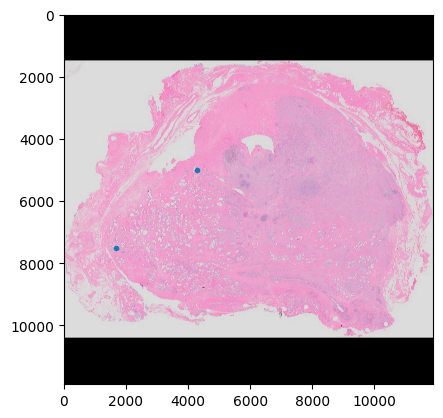

In [8]:
plt.imshow(warped_hist_img.data)
plt.plot(hist_points[:,0], hist_points[:,1], '.')

In [43]:
# Now do nonrigid registration

feature_extraction_cnn = 'resnet101'

# model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
# model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

model_aff_path = 'model_data/best_CombinedLoss_affine_resnet101.pth.tar'
model_tps_path = 'model_data/best_CombinedLoss_tps_resnet101.pth.tar'

registerer = ProsRegNetExt.init_registerer(path_to_affine_model=model_aff_path, 
                                           path_to_tps_model=model_tps_path, 
                                           feature_extraction_cnn=feature_extraction_cnn)

In [10]:
reg_result = registerer.register(
    hist_img=warped_hist_img.data,
    mri=mri_cube,
    hist_mask=warped_hist_mask.data,
    mri_mask=mri_masks,
    hist_resolution=hist_img.resolution,
    mri_resolution=mri_resolution,
    reg_resolution=reg_resolution,
    do_affine=True,
    do_tps=True
)

transform steps
{'hist': {'hist_input_size': (11892, 11892), 'hist_resolution': [DUnit(value=4, symbol='μm', factor=-6), DUnit(value=4, symbol='μm', factor=-6)]}, 'mri': {'mri_input_size': (320, 320), 'mri_resolution': (DUnit(value=Decimal('0.59375'), symbol='mm', factor=-3), DUnit(value=Decimal('0.59375'), symbol='mm', factor=-3))}, 'reg_resolution': (DUnit(value=75, symbol='μm', factor=-6), DUnit(value=75, symbol='μm', factor=-6))}
hist after scaling
(634, 634, 3)
mri after scaling
(30, 2533, 2533)
hist after preprocess_hist
(581, 581, 3)
mri_slice after cropping (221, 238)
mri_slice after padding
(638, 638)
mri_slice after cropping (316, 340)
mri_slice after padding
(638, 638)
mri_slice after cropping (356, 443)
mri_slice after padding
(638, 638)
mri_slice after cropping (364, 499)
mri_slice after padding
(638, 638)
mri_slice after cropping (380, 531)
mri_slice after padding
(638, 638)
mri_slice after cropping (412, 570)
mri_slice after padding
(638, 638)
mri_slice after cropping (4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1215404..1.010969].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12699567..1.0094484].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12517846..1.0111986].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12381037..1.0109627].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12250988..1.0121621].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12045474..1.01321].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1183

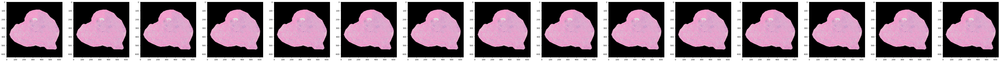

In [11]:
reg_result_ = reg_result['mri']['reg_result']

fig, axs = plt.subplots(1, len(reg_result_), figsize=(len(reg_result_)*6, 6))
for idx, key in enumerate(reg_result_):
    reg_res = reg_result_[key]
    axs[idx].imshow(reg_res[1]/255.)


In [44]:
warped_images = registerer.transform_image(warped_hist_img.data, reg_result, interpolation_mode='LINEAR')

image at beginning
(11892, 11892, 3)
image after scaling
(634, 634, 3)
step2
image after cropping
(423, 521, 3)
image after padding
(581, 581, 3)
step3
image after transform
(638, 638, 3)
step4
cropping params:  (208, 429, 200, 438)
image after cropping
(221, 238, 3)
cropping params (1196, 221, 1164, 238)
cropping_ right 1116 1131
image after padding
(2533, 2533, 3)
image after final resizing
(320, 320, 3)
image after transform
(638, 638, 3)
step4
cropping params:  (161, 477, 149, 489)
image after cropping
(316, 340, 3)
cropping params (1109, 316, 1109, 340)
cropping_ right 1108 1084
image after padding
(2533, 2533, 3)
image after final resizing
(320, 320, 3)
image after transform
(638, 638, 3)
step4
cropping params:  (141, 497, 97, 540)
image after cropping
(356, 443, 3)
cropping params (1085, 356, 1077, 443)
cropping_ right 1092 1013
image after padding
(2533, 2533, 3)
image after final resizing
(320, 320, 3)
image after transform
(638, 638, 3)
step4
cropping params:  (137, 501, 69, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-20..253].


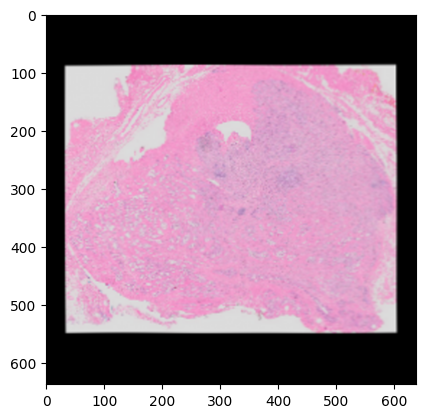

In [32]:
plt.imshow(warped_images.astype(int))

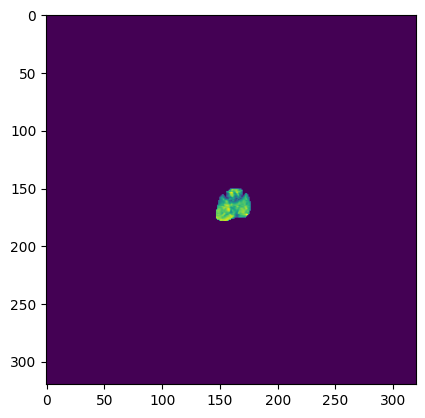

In [48]:
# plt.imshow(reg_result['mri']['reg_result'][5][3])
plt.imshow(mri_cube[5]*mri_masks[5])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12..250].


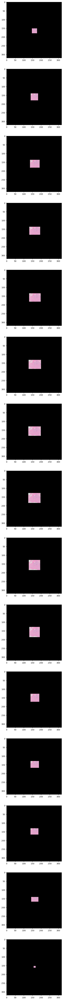

In [46]:
fig, axs = plt.subplots(len(warped_images), 1, figsize=(6, len(warped_images)*6))

for idx, key in enumerate(warped_images):
    warped_image = warped_images[key]
    axs[idx].imshow(warped_image.astype(int))


In [22]:
reg_result['mri']['mri_prepr']

{5: {'crop': {'y': 1164,
   'x': 1196,
   'h': 238,
   'w': 221,
   'size_before_crop': (2533, 2533)},
  'slice': 5,
  'sym_pad': {'ylo': 200, 'yhi': 200, 'xlo': 208, 'xhi': 209}},
 6: {'crop': {'y': 1109,
   'x': 1109,
   'h': 340,
   'w': 316,
   'size_before_crop': (2533, 2533)},
  'slice': 6,
  'sym_pad': {'ylo': 149, 'yhi': 149, 'xlo': 161, 'xhi': 161}},
 7: {'crop': {'y': 1077,
   'x': 1085,
   'h': 443,
   'w': 356,
   'size_before_crop': (2533, 2533)},
  'slice': 7,
  'sym_pad': {'ylo': 97, 'yhi': 98, 'xlo': 141, 'xhi': 141}},
 8: {'crop': {'y': 1045,
   'x': 1085,
   'h': 499,
   'w': 364,
   'size_before_crop': (2533, 2533)},
  'slice': 8,
  'sym_pad': {'ylo': 69, 'yhi': 70, 'xlo': 137, 'xhi': 137}},
 9: {'crop': {'y': 1037,
   'x': 1069,
   'h': 531,
   'w': 380,
   'size_before_crop': (2533, 2533)},
  'slice': 9,
  'sym_pad': {'ylo': 53, 'yhi': 54, 'xlo': 129, 'xhi': 129}},
 10: {'crop': {'y': 1014,
   'x': 1045,
   'h': 570,
   'w': 412,
   'size_before_crop': (2533, 2533)

In [68]:
reg_result['mri']['reg_result'][0][0]

tensor([[-1.0020, -0.9976, -0.9987, -0.9996, -0.9991, -1.0000, -0.5990, -0.5984,
         -0.5977, -0.6012, -0.6016, -0.5994, -0.2020, -0.1997, -0.1976, -0.2018,
         -0.2015, -0.1982,  0.1995,  0.2001,  0.1994,  0.2004,  0.2002,  0.1991,
          0.6012,  0.6001,  0.6025,  0.5977,  0.5996,  0.6004,  0.9985,  1.0014,
          1.0020,  1.0001,  0.9997,  1.0025, -0.9991, -0.6013, -0.1982,  0.1994,
          0.6004,  0.9994, -1.0011, -0.5999, -0.2017,  0.1981,  0.6014,  0.9987,
         -1.0013, -0.6003, -0.2021,  0.1978,  0.6014,  0.9994, -1.0005, -0.6000,
         -0.2013,  0.1977,  0.5998,  0.9992, -0.9985, -0.5979, -0.2023,  0.2020,
          0.6003,  0.9992, -0.9981, -0.6010, -0.1995,  0.1989,  0.6002,  1.0008]],
       grad_fn=<AddBackward0>)

In [17]:
hist_resolution = hist_img.resolution[0]
hist_conversion_factor_w = reg_resolution.get_conversion_factor(hist_resolution)   
mri_conversion_factor_w = reg_resolution.get_conversion_factor(mri_resolution)  
hist_conversion_factor_w, mri_conversion_factor_w

(Decimal('0.05333333333'), Decimal('7.91666666667'))

In [14]:
hist_resolution, reg_resolution, mri_resolution

(DUnit(value=4, symbol='μm', factor=-6),
 DUnit(value=75, symbol='μm', factor=-6),
 DUnit(value=Decimal('0.59375'), symbol='mm', factor=-3))

In [22]:
a = preprocess_mri2(sitk.GetArrayFromImage(mri_cube), sitk.GetArrayFromImage(mri_masks))

133


In [17]:
sitk.GetArrayFromImage(mri_cube)[0].shape

(320, 320)

In [ ]:
mri_cube.GetSpacing()
resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')

In [8]:
hist_img.scale_to_resolution(DUnit(75, 'um'))
hist_mask.scale_to_resolution(DUnit(75, 'um'))

In [10]:
w, h = hist_img.data.shape[:2]
hist_img.flip()
hist_mask.flip()

padding = get_padding_params(hist_img.data, np.max(hist_img.data.shape[:2]))
hist_img.pad(padding)
hist_mask.pad(padding)

In [8]:
mri_cube.GetSpacing()
resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
resolution = (resolution, resolution)
mri_cube_np = sitk.GetArrayFromImage(mri_cube)
mri_masks_np = sitk.GetArrayFromImage(mri_masks)
mri_slices = []
mri_mask_slices = []
for idx in range(mri_cube_np.shape[0]):
    resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
    resolution = (resolution, resolution)

    mask = mri_masks_np[idx]
    mask[mask != 0] = 1
    if mask.sum() == 0:
        continue
    mri_cube_np_ = mri_cube_np[idx] * mask
    points = np.argwhere(mask != 0)
    points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
    y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
    mri_cube_np_ = mri_cube_np_[x:x+w, y:y+h]
    mask = mask[x:x+w, y:y+h]
    mri_slice = MImage(data=mri_cube_np_, resolution=resolution)

    mri_slice.scale_to_resolution(DUnit(75, 'um'))
    mri_slices.append(mri_slice)
    resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
    resolution = (resolution, resolution)    
    mri_mask_slice = MAnnotation(data=mask, resolution=resolution)
    mri_mask_slice.scale_to_resolution(DUnit(75, 'um'))
    mri_mask_slices.append(mri_mask_slice)



In [10]:
slice_idx = 12
neighbor_slice_idx = 13

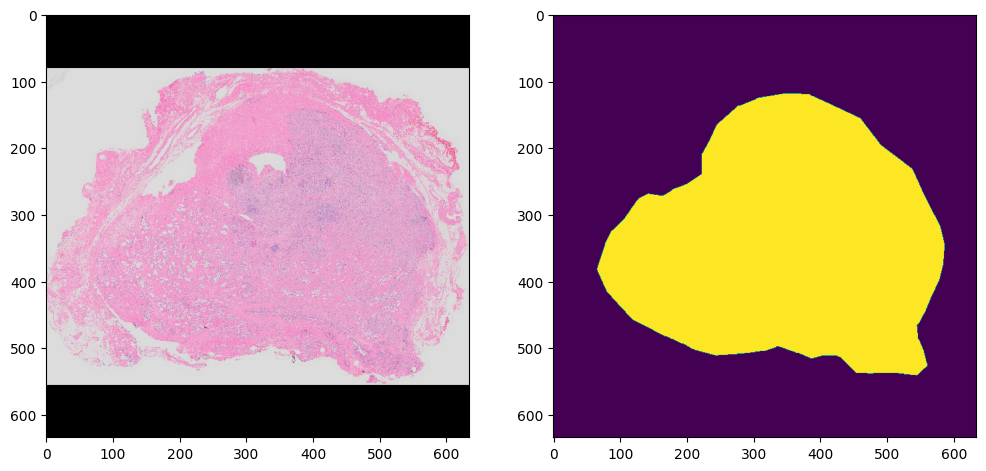

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(warped_hist_img.data)
axs[1].imshow(warped_hist_mask.data)

In [13]:
hist_img, hist_mask, hist_prepr_dict = preprocess_hist(warped_hist_img.data, warped_hist_mask.data)

In [14]:
mri_slices_np = [x.data.copy() for x in mri_slices]
mri_mask_slices_np = [x.data.copy() for x in mri_mask_slices]
prepr_mri = preprocess_mri(mri_slices_np, mri_mask_slices_np)

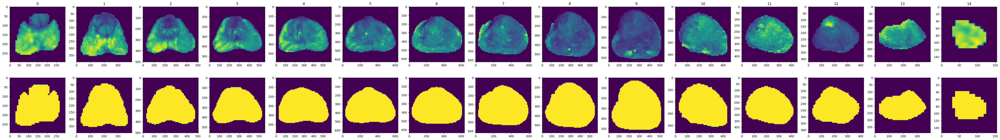

In [15]:
fig, axs = plt.subplots(2, len(prepr_mri), figsize=(4*len(prepr_mri), 4*2))
for idx, (mri, mri_mask, _, slice_idx) in enumerate(prepr_mri):
    axs[0, idx].imshow(mri)
    axs[1, idx].imshow(mri_mask)
    axs[0, idx].set_title(f'{slice_idx}')

In [26]:
a = sitk.GetArrayFromImage(mri_cube)
a.shape

(30, 320, 320)

In [32]:
sitk.GetArrayFromImage(mri_masks).shape

(30, 320, 320)

In [28]:
b = np.moveaxis(a, 0, 2)
c = scale_image(b, (2,2), interpolation=cv2.INTER_CUBIC)

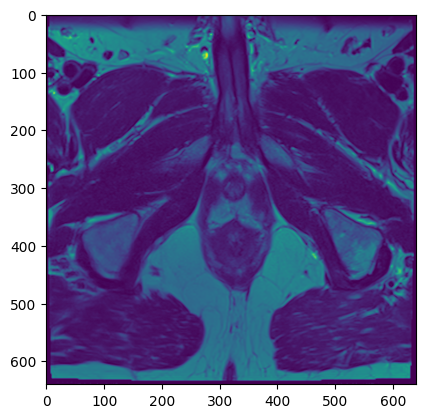

In [30]:
plt.imshow(c[:,:,5])

In [19]:
hist_resolution = DUnit('4', 'um')
mri_resolution = DUnit('0.5', 'mm')

hist_dec = hist_resolution.to_dec()
mri_dec = mri_resolution.to_dec()

In [20]:
hist_resolution.get_conversion_factor(mri_resolution)

Decimal('125.00000000000')

In [16]:
dir(hist_resolution)

['_DUnit__verify_symbol',
 '__annotations__',
 '__class__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_factor',
 '_symbol',
 'convert_to_unit',
 'default_dunit',
 'equal_instance',
 'factor',
 'from_dict',
 'get_conversion_factor',
 'scale',
 'symbol',
 'to_dec',
 'to_decimal',
 'to_float',
 'to_json',
 'value']

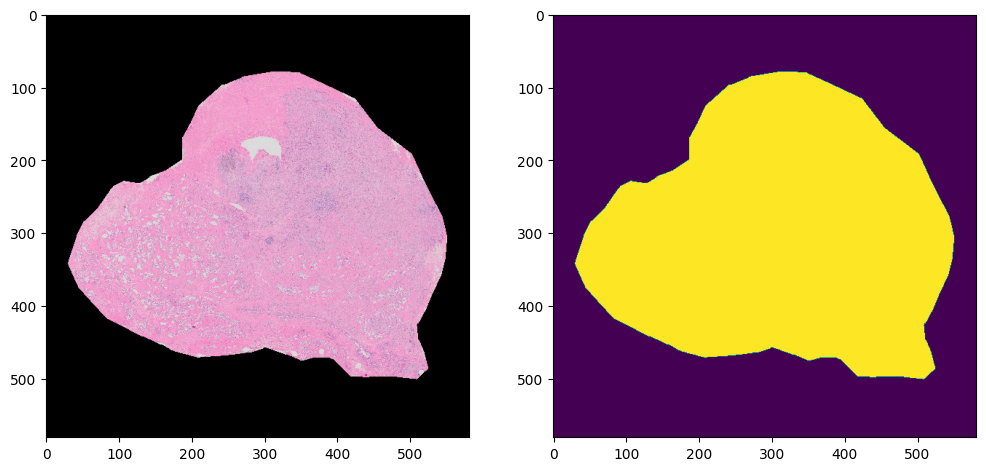

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(hist_img)
axs[1].imshow(hist_mask)

In [19]:
feature_extraction_cnn = 'resnet101'

# model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
# model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

model_aff_path = 'model_data/best_CombinedLoss_affine_resnet101.pth.tar'
model_tps_path = 'model_data/best_CombinedLoss_tps_resnet101.pth.tar'

model_cache = load_models(feature_extraction_cnn, model_aff_path, model_tps_path, do_deformable=True)

tr = [1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0]

half_out_size = 500

Creating CNN model...
Loading trained model weights...


In [32]:
feature_extraction_cnn = 'resnet101'

# model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
# model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

model_aff_path = 'model_data/best_CombinedLoss_affine_resnet101.pth.tar'
model_tps_path = 'model_data/best_CombinedLoss_tps_resnet101.pth.tar'

registerer = ProsRegNet.init_registerer(model_aff_path, model_tps_path, False, feature_extraction_cnn)

TypeError: ProsRegNet.__init__() got an unexpected keyword argument 'use_cuda'

In [20]:
def register(mri_slices: list[np.ndarray], 
             hist_image: np.ndarray, 
             model_cache,
             use_masks_as_affine: bool = True): 
    ####### grab files that were preprocessed 

    max_size = 0
    for mri_slice in mri_slices:
        temp_size = mri_slice.shape[0]
        if temp_size > max_size:
            max_size = temp_size
    
    reg_data = []
    count = len(mri_slices)
    for idx in range(count): 
        print(idx)
        imMri_highRes = mri_slices[idx]
        pad_len = int((max_size - imMri_highRes.shape[0]) // 2)
        if pad_len > 0:
            imMri_highRes = np.pad(imMri_highRes, ((pad_len, pad_len), (pad_len, pad_len)), constant_values=0)
        w_new, h_new = imMri_highRes.shape[:2]
        affTps, theta = runCnn(model_cache, hist_image, imMri_highRes, use_masks_as_affine)         
        affTps = cv2.resize(affTps*255, (int(h_new),  int(w_new)), interpolation=cv2.INTER_CUBIC)   
        
        reg_data.append((idx, hist_image, imMri_highRes, affTps, theta))
    
    return reg_data



In [21]:
p_mri_slices = []
p_mri_mask_slices = []
coords = []


for prepr_mri_ in prepr_mri:
    mri_slice, mri_mask, coord, slice = prepr_mri_
    p_mri_slices.append(mri_slice)
    p_mri_mask_slices.append(mri_mask)
    coords.append(coord)

In [24]:
reg_data = register(p_mri_slices, hist_img, model_cache, use_masks_as_affine = False)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09317545..1.0265453].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10638676..1.0562398].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1049996..1.0169607].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08107105..1.0045137].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.095252596..1.0272764].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.097131744..1.0523403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.104485914..1.0259081].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-

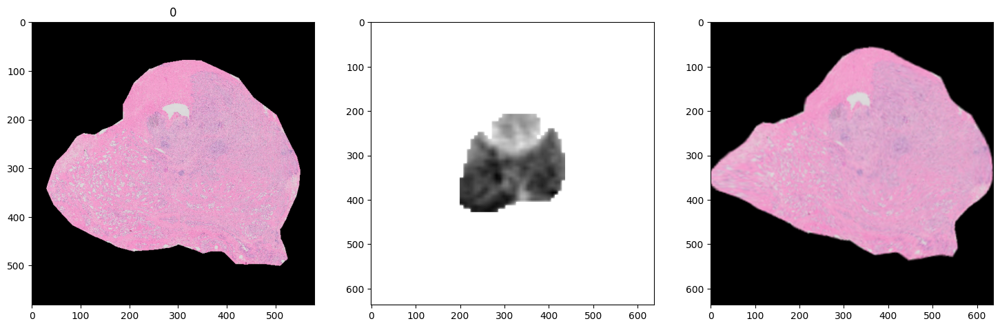

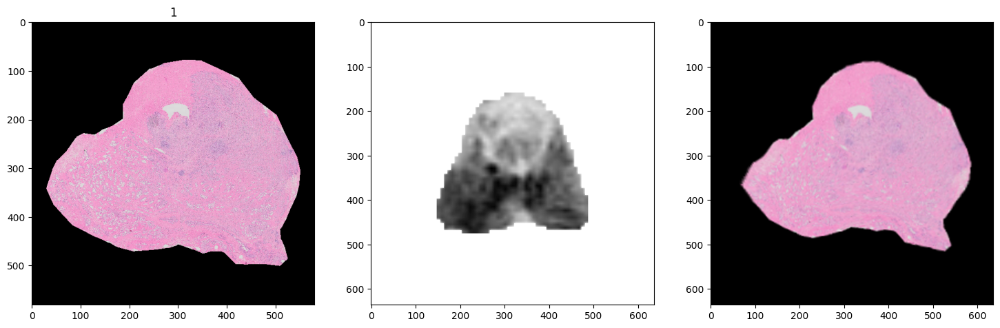

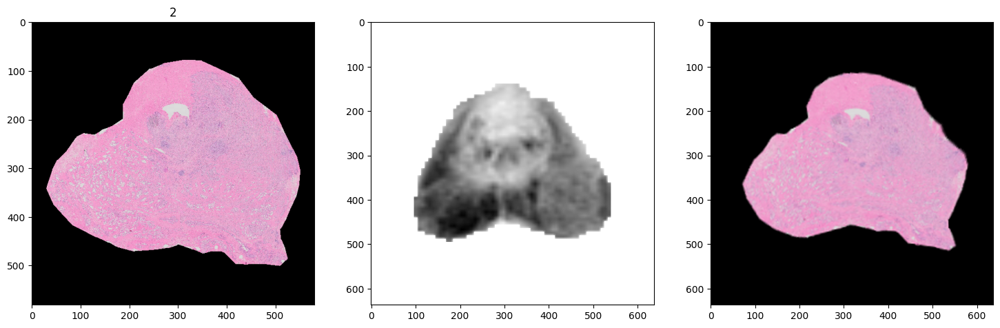

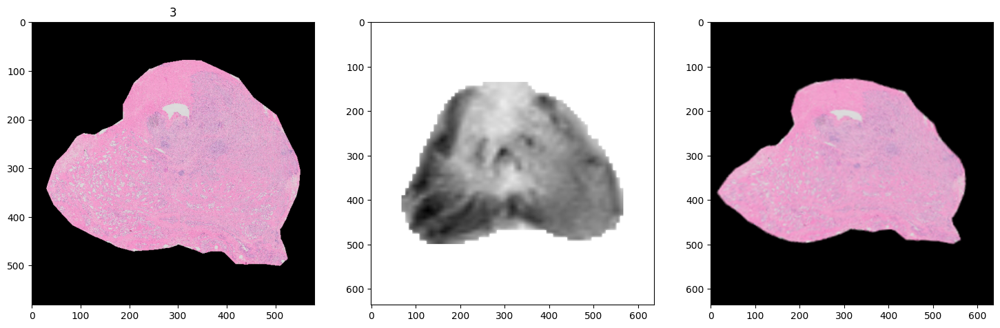

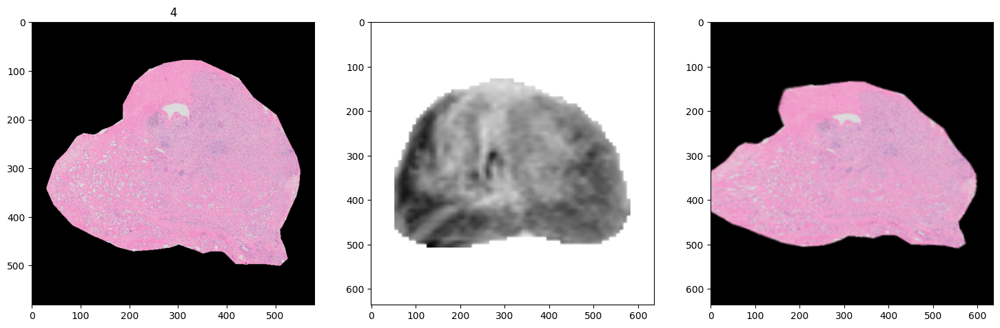

...

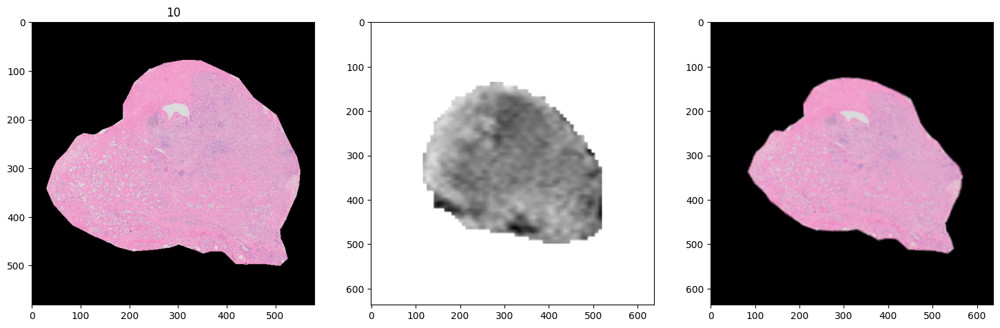

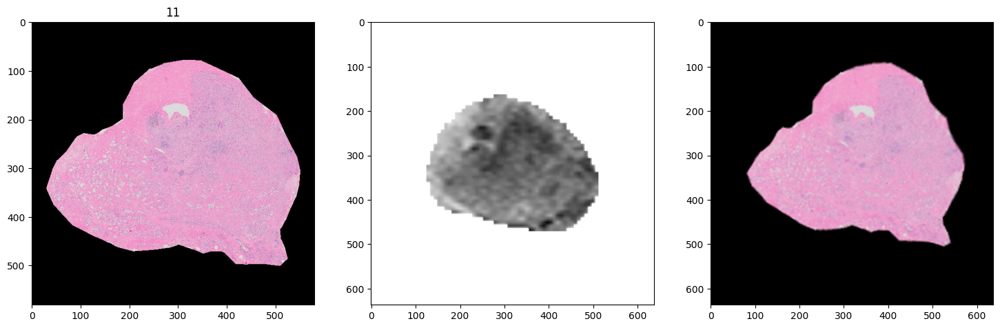

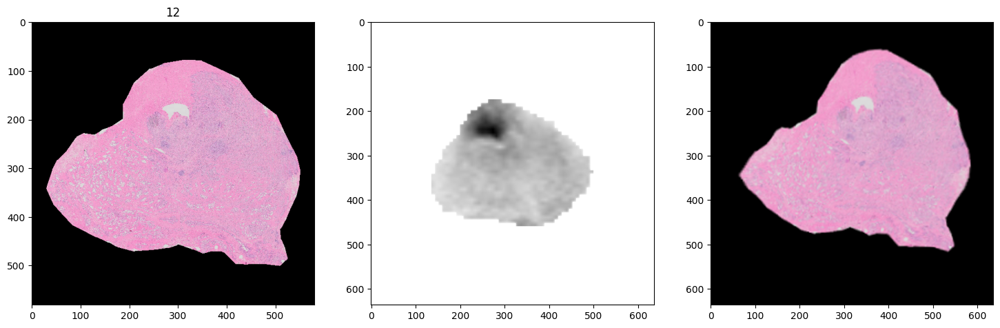

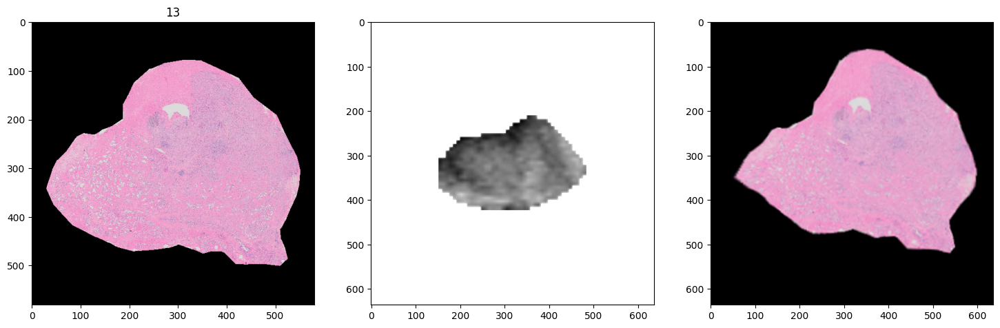

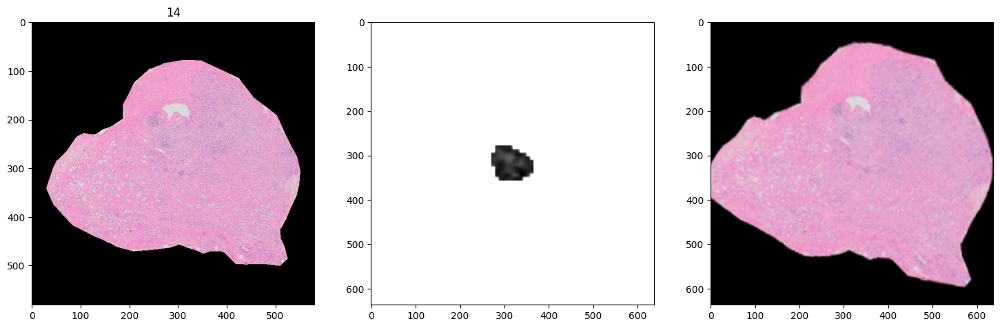

In [26]:
# fig, axs = plt.subplots(len(reg_data), 3, figsize=(18, len(reg_data)*6))
for idx, reg_ret in enumerate(reg_data):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    (_, hist_image, imMri_highRes, affTps, theta) = reg_ret
    axs[0].imshow(hist_image)
    axs[0].set_title(f'{idx}')
    axs[1].imshow(imMri_highRes, cmap=plt.cm.binary)
    axs[2].imshow(affTps/255)
    # axs[idx, 0].imshow(hist_image)
    # axs[idx, 0].set_title(f'{idx}')
    # axs[idx, 1].imshow(imMri_highRes, cmap=plt.cm.binary)
    # axs[idx, 2].imshow(affTps/255)

In [25]:
import torch
x = torch.zeros((1, 64, 5, 5))
x.view(x.size(0), -1)

tensor([[0., 0., 0.,  ..., 0., 0., 0.]])

In [5]:
####### INPUTS
# json_path = "jsonData/TCIA_FUSION.json"
# preprocess_moving = True
# preprocess_fixed = True
# run_registration = True
# extension = 'nii.gz'
# timings = {}

# try:
#     with open('coord.txt') as f:
#         coord = json.load(f)   
        
# except:
#     coord = {}

# ############### START REGISTRATION HERE

# json_obj = ParserRegistrationJson(json_path)

# studies = json_obj.studies
# toProcess = json_obj.ToProcess}
# outputPath = json_obj.output_path
outputPath = 'temp/out'
#cases = toProcess.keys()

if not os.path.isdir(outputPath):
    os.mkdir(outputPath) 

###### PREPROCESSING DESTINATIONS ######################################
preprocess_moving_dest = outputPath + 'preprocess/hist/'
preprocess_fixed_dest = outputPath + 'preprocess/mri/'
Path(preprocess_fixed_dest).mkdir(exist_ok=True, parents=True)
Path(preprocess_moving_dest).mkdir(exist_ok=True, parents=True)

# if not os.path.isdir(outputPath + 'preprocess\\'):
#     os.mkdir(outputPath + 'preprocess\\')

# if not os.path.isdir(preprocess_moving_dest):
#     os.mkdir(preprocess_moving_dest)
    
# if not os.path.isdir(preprocess_fixed_dest):
#     os.mkdir(preprocess_fixed_dest)

In [26]:
import numpy

def get_padding_params(img: numpy.array, shape: int) -> tuple[int, int, int, int]:
    pad_x = shape - img.shape[0]
    pad_x_l = pad_x // 2
    pad_x_u = pad_x // 2
    if pad_x % 2 != 0:
        pad_x_u += 1
    pad_y = shape - img.shape[1]
    pad_y_l = pad_y // 2
    pad_y_u = pad_y // 2
    if pad_y % 2 != 0:
        pad_y_u += 1
    return pad_y_l, pad_y_u, pad_x_l, pad_x_u

def preprocess_hist(img, mask):
    """Does the following preprocessing steps:
        1. Applies mask.
        2. Crops around the masked area.
        3. Adds padding.
    """

    # Downsize by 4. Or resize to 500px
    img = img * mask
    # This doesnt make sense, since the cropping happens immediately afterwards.
    # Maybe a refactoring mistake?
    # img = np.pad(img,((img.shape[0],img.shape[0]),(img.shape[1],img.shape[1]),(0,0)),'constant', constant_values=0)
    # mask = np.pad(mask,((mask.shape[0], mask.shape[0]), (mask.shape[1], mask.shape[1]),(0,0)),'constant', constant_values=0)

    # create a bounding box around slice
    preprocessing_steps = {}
    points = np.argwhere(mask != 0)
    points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
    y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
    preprocessing_steps['y'] = y
    preprocessing_steps['x'] = x
    preprocessing_steps['h'] = h
    preprocessing_steps['w'] = w
    # Pad to a square shape now.
    max_size = max(img.shape[0], img.shape[1])
    xlo, xhi, ylo, yhi = get_padding_params(img, max_size)
    img = np.pad(img,((xlo, xhi),(ylo, yhi),(0,0)),'constant', constant_values=0)
    mask = np.pad(mask,((xlo, xhi), (ylo, yhi)),'constant', constant_values=0)
    preprocessing_steps['padding'] = (xlo, xhi, ylo, yhi)
    return img, mask, preprocessing_steps

# def preprocess_mri_miit()


In [6]:
preprocessed_hist = preprocess_hist2(hist_img, hist_mask)
coord, preprocessed_mri, preprocessed_mri_masks = preprocess_mri2(mri_cube, mri_masks)

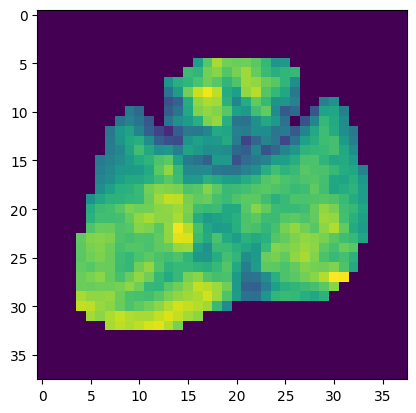

In [17]:
plt.imshow(preprocessed_mri[0])

Creating CNN model...
Loading trained model weights...


ValueError: could not broadcast input array from shape (38,38) into shape (1387,1388,3)

In [3]:
# start doing preprocessing on each case and register
for s in json_obj.studies:
    if json_obj.ToProcess:
        if not (s in json_obj.ToProcess):
            print("Skipping", s)
            continue

    print("x"*30, "Processing", s,"x"*30)
    studyDict = json_obj.studies[s] 


    studyParser = ParserStudyDict(studyDict)
    
    sid = studyParser.id
    fixed_img_mha = studyParser.fixed_filename
    fixed_seg = studyParser.fixed_segmentation_filename
    moving_dict = studyParser.ReadMovingImage()

    ###### PREPROCESSING HISTOLOGY HERE #############################################################
    if preprocess_moving == True: 
        print('Preprocessing moving sid:', sid, '...')
        preprocess_hist(moving_dict, preprocess_moving_dest, sid)
        print('Finished preprocessing', sid)

    ###### PREPROCESSING MRI HERE #############################################################
    if preprocess_fixed == True:
        print ("Preprocessing fixed case:", sid, '...')

        coord = preprocess_mri(fixed_img_mha, fixed_seg, preprocess_fixed_dest, coord, sid)

        print("Finished processing fixed mha", sid)

        with open('coord.txt', 'w') as json_file: 
            json.dump(coord, json_file)
    ##### ALIGNMENT HERE ########################################################################
    if run_registration == True: 
        
        ######## LOAD MODELS
        print('.'*30, 'Begin deep learning registration for ' + sid + '.'*30)

        try:
            model_cache
        except NameError:
            feature_extraction_cnn = 'resnet101'

            model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
            model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

            model_cache = load_models(feature_extraction_cnn, model_aff_path, model_tps_path, do_deformable=True)
        
        start = time.time()
        output3D_cache = register(preprocess_moving_dest + sid + '\\', preprocess_fixed_dest + sid + '\\', coord, model_cache, sid)
        out3Dhist_highRes, out3Dmri_highRes, out3Dcancer_highRes, out3D_region00, out3D_region10, out3D_region09, out3Dmri_mask = output3D_cache
        end = time.time()
        print("Registration done in {:6.3f}(min)".format((end-start)/60.0))
        imMri = sitk.ReadImage(fixed_img_mha)
        mriOrigin = imMri[:,:,coord[sid]['slice'][0]:coord[sid]['slice'][-1]].GetOrigin()
        mriSpace  = imMri.GetSpacing()
        mriDirection = imMri.GetDirection()

        imSpatialInfo = (mriOrigin, mriSpace, mriDirection)

        # write output hist 3D volume to .nii.gz format
        fn_moving_highRes = '_moved_highres_rgb.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3Dhist_highRes, sid, fn_moving_highRes, imSpatialInfo, coord, imMri, extension = "nii.gz")

        #write output mri 3D volume to .nii.gz format
        fn_fixed_highRes = '_fixed_image.'
        output_results(outputPath, out3Dmri_highRes, sid, fn_fixed_highRes, imSpatialInfo, extension = "nii.gz")

        #write output cancer outline 3D volume to .nii.gz format
        fn_cancer_highRes = '_moved_highres_region01_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3Dcancer_highRes, sid, fn_cancer_highRes, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write region00
        fn_region00 = '_moved_highres_region00_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3D_region00, sid, fn_region00, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write region10
        fn_region00 = '_moved_highres_region10_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3D_region10, sid, fn_region00, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write region09
        fn_region00 = '_moved_highres_region09_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3D_region09, sid, fn_region00, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write mriMask
        fn_mriMask = '_fixed_mask_label.'
        output_results(outputPath, out3Dmri_mask, sid, fn_mriMask, imSpatialInfo, extension = "nii.gz")

        timings[s] = (end-start)/60.0
        print('Done!')

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx Processing aaa0069 xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
Preprocessing moving sid: aaa0069 ...
Finished preprocessing aaa0069
Preprocessing fixed case: aaa0069 ...
Finished processing fixed mha aaa0069
.............................. Begin deep learning registration for aaa0069..............................
Creating CNN model...
Loading trained model weights...
Registration done in  0.156(min)
Done!


In [ ]:
json.dump(timings, open("timings.txt",'w'))